# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle that contains information on 3 million used cars.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

## Using the exiting data from previous sales records, identify which are the main features contributing to car price and build a model to predict the price of a used car.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

## Steps to know and explore the dataset
### 1) Identify the type of features numeric vs string
### 2) Identify which features are irrelevant to price prediction
### 3) Identify how many null records are present in the dataset and how those values can be filled.
### 4) Identify if there are any values which are zero, specificially car price.
### 5) Identify if there are any features with categorical data , identify ways of how to covert these.
### 6) Idetify correlation between features and try to reduce multicollinearity.
### 7) Identify if any scaling is required.



### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer,KNNImputer
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE, SequentialFeatureSelector
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer,make_column_selector
from sklearn.metrics import mean_squared_error
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.compose import make_column_transformer, TransformedTargetRegressor
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.preprocessing import StandardScaler


import warnings
#warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('../practical_application_II_starter/data/vehicles.csv')

In [3]:
df.info() # df.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

<AxesSubplot:xlabel='price'>

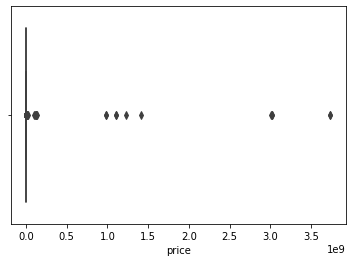

In [4]:
sns.boxplot( df['price'] )


In [5]:
# Trying to reduce the outliers in the Price - We are considering records withon a price range
df = df[(df['price']>500) & (df['price']<50000)]


<AxesSubplot:xlabel='price'>

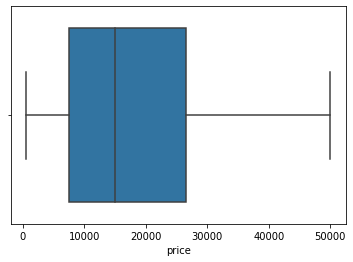

In [6]:
sns.boxplot( df['price'] )


In [7]:
# We will be dropping of id, VIN later as they are not relevant to price of the vehicle

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 370724 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            370724 non-null  int64  
 1   region        370724 non-null  object 
 2   price         370724 non-null  int64  
 3   year          369861 non-null  float64
 4   manufacturer  356578 non-null  object 
 5   model         366679 non-null  object 
 6   condition     233934 non-null  object 
 7   cylinders     220592 non-null  object 
 8   fuel          368215 non-null  object 
 9   odometer      368715 non-null  float64
 10  title_status  364057 non-null  object 
 11  transmission  368994 non-null  object 
 12  VIN           226039 non-null  object 
 13  drive         257254 non-null  object 
 14  size          105717 non-null  object 
 15  type          291204 non-null  object 
 16  paint_color   263993 non-null  object 
 17  state         370724 non-null  object 
dtypes: f

In [9]:
# dropping the price rows where price = 0 
# We could impute the values where price is zero
df = df.query('price !=0')

In [10]:
#. Drop rows where odometer is nan
# Similarly we can impute the odometer NaN values, since these are very less dropping NaN
df = df[pd.notnull(df['odometer'])]

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 368715 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            368715 non-null  int64  
 1   region        368715 non-null  object 
 2   price         368715 non-null  int64  
 3   year          367914 non-null  float64
 4   manufacturer  354674 non-null  object 
 5   model         364737 non-null  object 
 6   condition     232621 non-null  object 
 7   cylinders     219689 non-null  object 
 8   fuel          366476 non-null  object 
 9   odometer      368715 non-null  float64
 10  title_status  362314 non-null  object 
 11  transmission  367285 non-null  object 
 12  VIN           225078 non-null  object 
 13  drive         255751 non-null  object 
 14  size          105253 non-null  object 
 15  type          289654 non-null  object 
 16  paint_color   262783 non-null  object 
 17  state         368715 non-null  object 
dtypes: 

In [12]:
# dropping remaining records where year,manufacturer,model have null values 
# Again since dropping these as its a small fraction of the total number of records
df = df[pd.notnull(df['year'])]
df = df[pd.notnull(df['manufacturer'])]
df = df[pd.notnull(df['model'])]
df = df[pd.notnull(df['transmission'])]
df = df[pd.notnull(df['fuel'])]


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 347457 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            347457 non-null  int64  
 1   region        347457 non-null  object 
 2   price         347457 non-null  int64  
 3   year          347457 non-null  float64
 4   manufacturer  347457 non-null  object 
 5   model         347457 non-null  object 
 6   condition     220959 non-null  object 
 7   cylinders     208403 non-null  object 
 8   fuel          347457 non-null  object 
 9   odometer      347457 non-null  float64
 10  title_status  341807 non-null  object 
 11  transmission  347457 non-null  object 
 12  VIN           214644 non-null  object 
 13  drive         242530 non-null  object 
 14  size          99333 non-null   object 
 15  type          275159 non-null  object 
 16  paint_color   248429 non-null  object 
 17  state         347457 non-null  object 
dtypes: 

## Hypothesis


<AxesSubplot:xlabel='odometer', ylabel='price'>

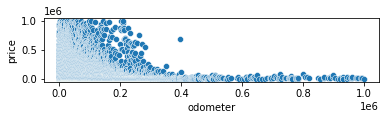

In [92]:
#1 Used cars with high Mailage should be cheaper or the cars with low mileage should be costlier
m = df[['odometer', 'price']].groupby( 'odometer' ).sum().reset_index()
plt.subplot(3,1,1)
sns.scatterplot( x=m[m['odometer']<1000000]['odometer'], y=m[m['price']<1000000]['price'], data=m)


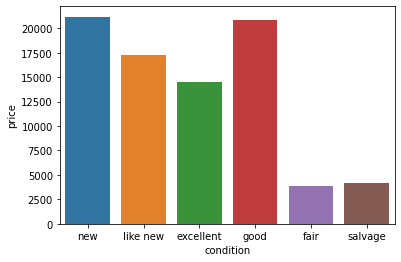

In [15]:
#2 Used cars with better appearance should be expensive.
aux1 = df[['condition', 'price']].groupby( 'condition' ).mean().reset_index()
sns.barplot( x='condition', y='price', data=aux1, order=['new', 'like new', 'excellent', 'good', 'fair', 'salvage']);


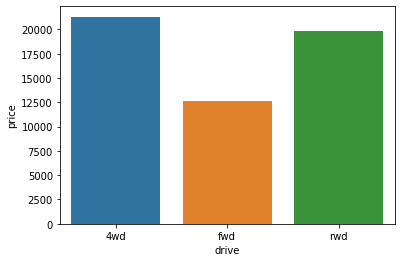

In [16]:
#3 Used cars with 4wd drive should be cost more.
aux1 = df[['drive', 'price']].groupby( 'drive' ).mean().reset_index()
sns.barplot( x='drive', y='price', data=aux1);


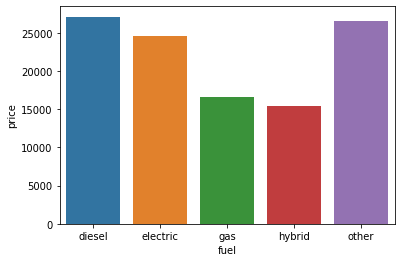

In [17]:
#4 Used electric fuel cars should be expensive.
aux1 = df[['fuel', 'price']].groupby( 'fuel' ).mean().reset_index()
sns.barplot( x='fuel', y='price', data=aux1);

In [19]:
# Handling categorical variables
df['cylinders'] = df['cylinders'].astype('category')
df['size'] = df['size'].astype('category')
df['type'] = df['type'].astype('category')
df['drive'] = df['drive'].astype('category')
df['paint_color'] = df['paint_color'].astype('category')
df['manufacturer'] = df['manufacturer'].astype( 'category' )
df['model'] = df['model'].astype( 'category' )



In [20]:
#Using LabelEncoder to convert categorical variables to numerical
le = preprocessing.LabelEncoder()
df['cylinders'] = le.fit_transform( df['cylinders'] )
df['size'] = le.fit_transform( df['size'] )
df['type'] = le.fit_transform( df['type'] )
df['drive'] = le.fit_transform( df['drive'] )
df['paint_color'] = le.fit_transform( df['paint_color'] )
df['manufacturer'] = le.fit_transform( df['manufacturer'] )
df['model'] = le.fit_transform( df['model'] )

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 347457 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            347457 non-null  int64  
 1   region        347457 non-null  object 
 2   price         347457 non-null  int64  
 3   year          347457 non-null  float64
 4   manufacturer  347457 non-null  int64  
 5   model         347457 non-null  int64  
 6   condition     220959 non-null  object 
 7   cylinders     347457 non-null  int64  
 8   fuel          347457 non-null  object 
 9   odometer      347457 non-null  float64
 10  title_status  341807 non-null  object 
 11  transmission  347457 non-null  object 
 12  VIN           214644 non-null  object 
 13  drive         347457 non-null  int64  
 14  size          347457 non-null  int64  
 15  type          347457 non-null  int64  
 16  paint_color   347457 non-null  int64  
 17  state         347457 non-null  object 
dtypes: 

In [22]:
#Dropping NAN for title_status
df = df[df['title_status'].notna()]

In [23]:
# Mark NaN in condition column to other
df[['condition']] = df[['condition']].fillna('other')

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 341807 entries, 27 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            341807 non-null  int64  
 1   region        341807 non-null  object 
 2   price         341807 non-null  int64  
 3   year          341807 non-null  float64
 4   manufacturer  341807 non-null  int64  
 5   model         341807 non-null  int64  
 6   condition     341807 non-null  object 
 7   cylinders     341807 non-null  int64  
 8   fuel          341807 non-null  object 
 9   odometer      341807 non-null  float64
 10  title_status  341807 non-null  object 
 11  transmission  341807 non-null  object 
 12  VIN           209021 non-null  object 
 13  drive         341807 non-null  int64  
 14  size          341807 non-null  int64  
 15  type          341807 non-null  int64  
 16  paint_color   341807 non-null  int64  
 17  state         341807 non-null  object 
dtypes: 

<AxesSubplot:xlabel='price', ylabel='Density'>

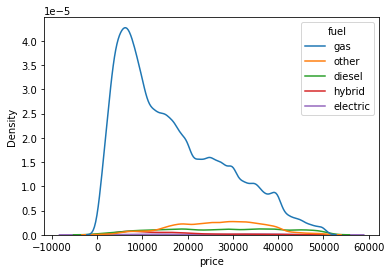

In [25]:
sns.kdeplot(data=df, x="price",hue="fuel")


<AxesSubplot:xlabel='price', ylabel='Density'>

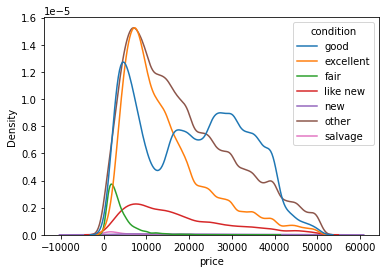

In [26]:
# excellent and good condition vehicles tend to drive the price higher
sns.kdeplot(data=df, x="price",hue="condition")


<AxesSubplot:xlabel='price', ylabel='Density'>

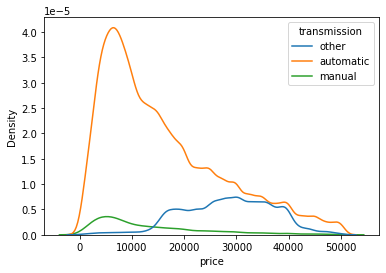

In [27]:
sns.kdeplot(data=df, x="price",hue="transmission")


<AxesSubplot:xlabel='price', ylabel='Density'>

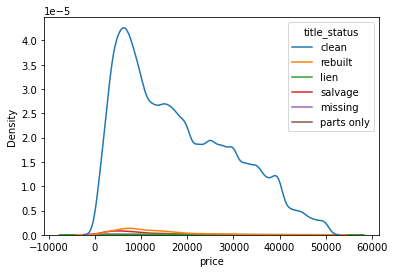

In [28]:
# the dataset has mostly clean title vehicles.
sns.kdeplot(data=df, x="price",hue="title_status")



In [29]:
# Dividing states into region and setting vale in region column
#This will give us 4 values for region 
#west         
#south        
#midwest      
#northeast   
# we can then drop state column

df['region'] = df['state'].replace( {"ct": "northeast", "me": "northeast", "ma": "northeast", "nh": "northeast", "ri": "northeast", "vt": "northeast", "nj": "northeast", "ny": "northeast", "pa": "northeast", "il": "midwest", 
                                       "in": "midwest", "mi": "midwest", "oh": "midwest", "wi": "midwest", "ia": "midwest", "ks": "midwest", "mn": "midwest", "mo": "midwest", "ne": "midwest", "nd": "midwest", "sd": "midwest",
                                       "de":"south", "fl":"south", "ga":"south", "md":"south", "nc":"south", "sc":"south", "va":"south", "dc":"south", "wv":"south", "al":"south", "ky":"south", "ms":"south", "tn":"south", 
                                       "ar":"south", "la":"south", "ok":"south", "tx":"south", "az":"west", "co":"west", "id":"west", "mt":"west", "nv":"west", "nm":"west", "ut":"west", "wy":"west", "ak":"west", "ca":"west",
                                       "hi":"west", "or":"west", "wa":"west"} )

<AxesSubplot:xlabel='region', ylabel='count'>

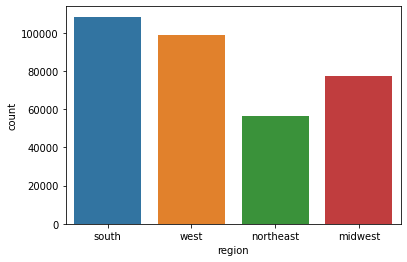

In [30]:
df['region'].value_counts()
sns.countplot( df['region'] )


In [31]:
# Transforming year to number of years w.r.t 2022, we can then drop year column
df['vehicle_age'] = 2022.00 - df['year']


In [32]:
# Manually encoding the condition values to numeric
condition_dict = {'other': 0, 'new': 6, 'like new': 5, 'excellent': 4, 'good': 3, 'fair': 2, 'salvage': 1}
df['condition'] = df['condition'].map( condition_dict )

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 341807 entries, 27 to 426879
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            341807 non-null  int64  
 1   region        341807 non-null  object 
 2   price         341807 non-null  int64  
 3   year          341807 non-null  float64
 4   manufacturer  341807 non-null  int64  
 5   model         341807 non-null  int64  
 6   condition     341807 non-null  int64  
 7   cylinders     341807 non-null  int64  
 8   fuel          341807 non-null  object 
 9   odometer      341807 non-null  float64
 10  title_status  341807 non-null  object 
 11  transmission  341807 non-null  object 
 12  VIN           209021 non-null  object 
 13  drive         341807 non-null  int64  
 14  size          341807 non-null  int64  
 15  type          341807 non-null  int64  
 16  paint_color   341807 non-null  int64  
 17  state         341807 non-null  object 
 18  veh

In [34]:
# Manually encoding the fuel values to numeric

fuel_dict = {'other': 0, 'diesel': 4, 'electric': 3, 'gas': 2, 'hyrid': 1}
df['fuel'] = df['fuel'].map( fuel_dict )

In [35]:
# Manually encoding the title_status values to numeric

tstatus_dict = {'other': 0, 'clean': 6, 'lien': 5, 'salvage': 4, 'rebuilt': 3, 'missing': 2, 'parts only': 1}
df['title_status'] = df['title_status'].map( tstatus_dict )

In [36]:
# Finally dropping State, ID, VIN, Year
df.drop('state', axis=1, inplace=True) # Dropping state as we have the four regions mapped
df.drop('id', axis=1, inplace=True)
df.drop('VIN', axis=1, inplace=True)
df.drop('year', axis=1, inplace=True) # Dropping year as we have the vehicle_age calculated above

In [37]:
df[['fuel']] = df[['fuel']].fillna(0)

In [38]:
df.isnull().sum()

region          0
price           0
manufacturer    0
model           0
condition       0
cylinders       0
fuel            0
odometer        0
title_status    0
transmission    0
drive           0
size            0
type            0
paint_color     0
vehicle_age     0
dtype: int64

In [39]:
# Final Cleaned Dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 341807 entries, 27 to 426879
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        341807 non-null  object 
 1   price         341807 non-null  int64  
 2   manufacturer  341807 non-null  int64  
 3   model         341807 non-null  int64  
 4   condition     341807 non-null  int64  
 5   cylinders     341807 non-null  int64  
 6   fuel          341807 non-null  float64
 7   odometer      341807 non-null  float64
 8   title_status  341807 non-null  int64  
 9   transmission  341807 non-null  object 
 10  drive         341807 non-null  int64  
 11  size          341807 non-null  int64  
 12  type          341807 non-null  int64  
 13  paint_color   341807 non-null  int64  
 14  vehicle_age   341807 non-null  float64
dtypes: float64(3), int64(10), object(2)
memory usage: 49.8+ MB


In [40]:
# saving the cleaned dataset to file
df.to_csv("cleaned_vehicle", encoding='utf-8', index=False)

In [41]:
#creating copy of the dataset
df_copy = df

In [42]:
# OneHot encoding on transmission,region 
df = pd.get_dummies( df, prefix=['transmission'], columns=['transmission'] )
df = pd.get_dummies( df, prefix=['region'], columns=['region'] )

In [43]:
## Independent and dependent features
XI = df.iloc[:,1:]
yi = df.iloc[:,0]

<AxesSubplot:>

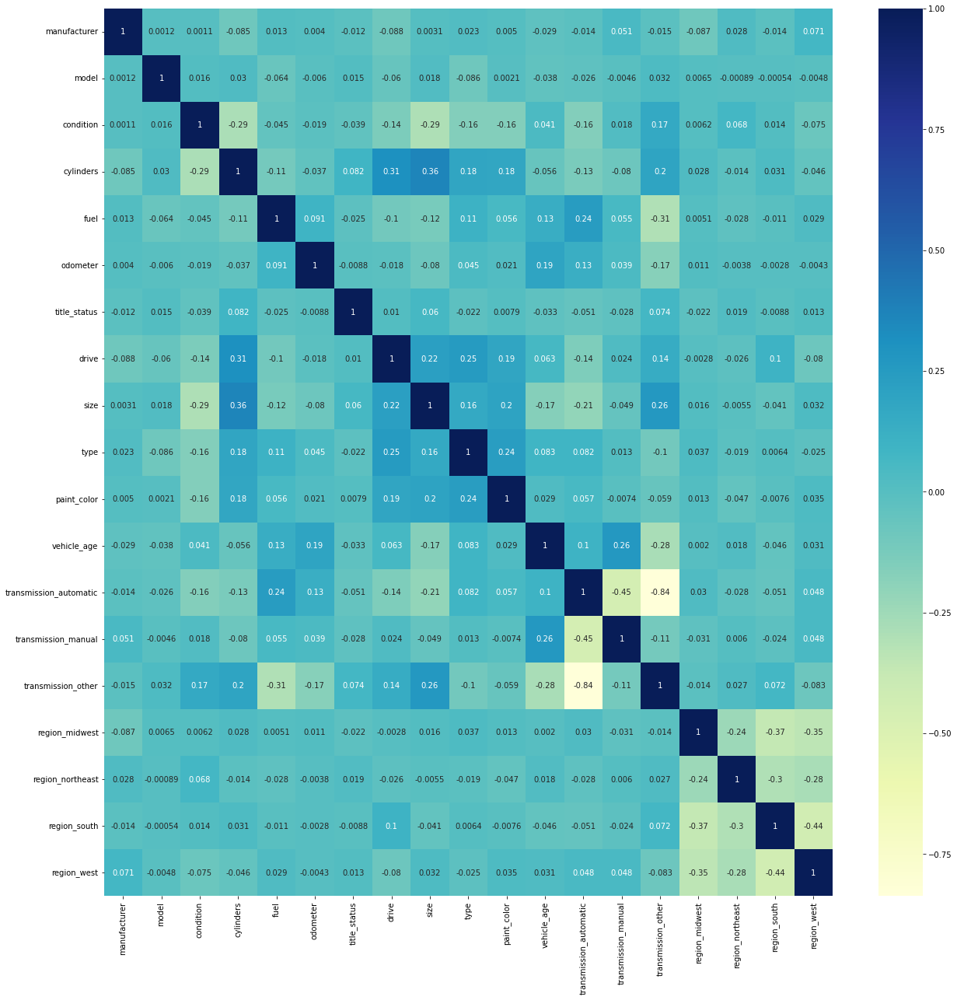

In [44]:
# Plotting heatmap to see any highly correlated features
cormat = XI.corr()
top_corr_features = cormat.index
plt.figure(figsize=(21,21))
sns.heatmap(XI[top_corr_features].corr(),annot=True,cmap="YlGnBu")

In [45]:
# From the heatmap above I could not see any higly(>.70) correlated features

## Performing Features importance using ExtraTreesRegressor

In [46]:
model = ExtraTreesRegressor()
model.fit(XI,yi)


ExtraTreesRegressor()

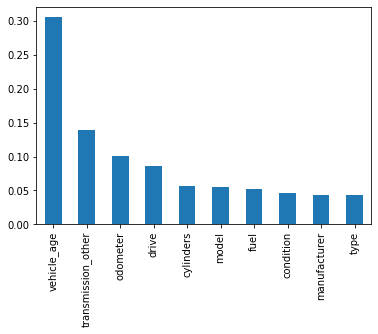

In [47]:
feature_imp = pd.Series(model.feature_importances_,index=XI.columns)
feature_imp.nlargest(10).plot(kind='bar')
plt.show()

In [48]:
# Based on ExtraTreesRegressor result TOP features are vehicle_age, transmission_other, odometer, drive, cylinders.

## Calculating importance of features using permutation_importance

In [49]:
df_ridge = df_copy

In [50]:
df_ridge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 341807 entries, 27 to 426879
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        341807 non-null  object 
 1   price         341807 non-null  int64  
 2   manufacturer  341807 non-null  int64  
 3   model         341807 non-null  int64  
 4   condition     341807 non-null  int64  
 5   cylinders     341807 non-null  int64  
 6   fuel          341807 non-null  float64
 7   odometer      341807 non-null  float64
 8   title_status  341807 non-null  int64  
 9   transmission  341807 non-null  object 
 10  drive         341807 non-null  int64  
 11  size          341807 non-null  int64  
 12  type          341807 non-null  int64  
 13  paint_color   341807 non-null  int64  
 14  vehicle_age   341807 non-null  float64
dtypes: float64(3), int64(10), object(2)
memory usage: 49.8+ MB


In [51]:
X_ridge =df_ridge.drop('price',axis =1)
y_ridge = df_ridge['price']

In [52]:
 X_train, X_test, y_train, y_test = train_test_split(X_ridge, y_ridge, test_size=0.3, random_state=42)

In [53]:
X_ridge.head()

,region,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,vehicle_age
27,south,14,16144,3,6,2.0,57923.0,6,other,3,4,8,10,8.0
28,south,7,16432,3,6,2.0,71229.0,6,other,3,4,8,1,12.0
29,south,7,16454,3,6,2.0,19160.0,6,other,3,4,8,8,2.0
30,south,38,18927,3,6,2.0,41124.0,6,other,3,4,8,8,5.0
31,south,13,8253,4,5,2.0,128000.0,6,automatic,2,1,10,0,9.0


In [54]:
## Calculating Best Alpha for Ridge model using TransformedTargetRegressor
### using OneHotEncoder for categorical features

In [55]:
alpha = [.00001,.0001,.001,.01,.1,1,10,100,1000,10000,100000]
cat_features =['region','transmission']
coef_list = []
train_scores =[]
test_scores = []
test_mses = []
# using OneHotEncoder for categorical features
ohe_transformer = make_column_transformer(((OneHotEncoder(drop ='if_binary', handle_unknown='ignore'),cat_features)),
                                          (PolynomialFeatures(degree = 2), make_column_selector(dtype_include=np.number)))
for a in alpha:
    pipe = Pipeline([('transformer', ohe_transformer),('tregressor',TransformedTargetRegressor(func=np.log1p,
                                                                                          inverse_func=np.expm1,
                                                                                          regressor=Ridge(alpha=a)))])
    pipe.fit(X_train,y_train)
    coef_list.append(list(pipe.named_steps['tregressor'].regressor_.coef_))
    test_mses.append(mean_squared_error(y_test,pipe.predict(X_test)))
    train_scores.append(pipe.score(X_train,y_train))
    test_scores.append(pipe.score(X_test,y_test))

    
print(pd.DataFrame(test_scores,alpha))
print("Best alpha :",alpha[test_mses.index(min(test_mses))])

                     0
0.00001      -1.761268
0.00010      -1.761268
0.00100      -1.761268
0.01000      -1.761270
0.10000      -1.761286
1.00000      -1.761441
10.00000     -1.762968
100.00000    -1.776075
1000.00000   -1.822982
10000.00000  -1.804290
100000.00000 -1.253221
Best alpha : 100000


In [56]:
##  Calculating importance of features using permutation_importance
### (Ridge model with alpha = 100000)

In [57]:
 pipe_1 = Pipeline([('transformer', ohe_transformer),('tregressor',TransformedTargetRegressor(func=np.log1p,
                                                                                          inverse_func=np.expm1,
                                                                                          regressor=Ridge(alpha=100000)))])

In [58]:
pipe_1.fit(X_train,y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(drop='if_binary',
                                                                handle_unknown='ignore'),
                                                  ['region', 'transmission']),
                                                 ('polynomialfeatures',
                                                  PolynomialFeatures(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x131a949a0>)])),
                ('tregressor',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=Ridge(alpha=100000)))])

In [59]:
r = permutation_importance(pipe_1, X_test, y_test, n_repeats = 30, random_state = 42)

In [60]:
print("importance:" , r.importances_mean)


importance: [ 6.93288415e-02  1.26531183e-01 -5.72103810e-01 -4.88808996e-01
  3.32695041e+00  2.86874577e+04  2.50961054e+09  3.53502805e-01
  2.65472016e-02  8.76890520e+00  6.92640589e-01  7.34575366e-01
 -1.80833795e-03  1.67415346e+00]


In [61]:
pd.DataFrame({"Variable":X_ridge.columns, "Score":r.importances_mean}).sort_values(by = "Score", ascending = False)

,Variable,Score
6,odometer,2.509611e+09
5,fuel,2.868746e+04
9,drive,8.768905e+00
4,cylinders,3.326950e+00
13,vehicle_age,1.674153e+00
11,type,7.345754e-01
10,size,6.926406e-01
7,title_status,3.535028e-01
1,manufacturer,1.265312e-01
0,region,6.932884e-02


### Modelling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [62]:
## Few helper functions which will be used during modelling

def mlerror( model_name, y, yhat ):
    mae = mean_absolute_error( y, yhat )
    mape = mean_abs_per_error( y, yhat )
    rmse = np.sqrt( mean_squared_error( y, yhat ) )
    
    return pd.DataFrame( { 'Model': model_name,
                           'MAE': mae,
                           'MAPE': mape,
                           'RMSE': rmse }, index=[0] )

def mean_abs_per_error( y, yhat ):
    return np.mean( np.abs( (y - yhat ) / y ) )

def cross_val( X_training, kfold, model_name, model, verbose=False ):
    
    mae_list = []
    mape_list = []
    rmse_list = []

    for k in reversed( range( 1, kfold+1 ) ):
        if verbose:
            print( '\nKFold Number: {}'.format( k ) )
        
        # filtering dataset
        training = X_training
        validation = X_training

        # training and validation dataset
        # training
        xtraining = training.drop( ['price' ], axis=1 )
        ytraining = training['price']

        #validation
        xvalidation = validation.drop( ['price'], axis=1 )
        yvalidation = validation['price']

        # model
        m = model.fit( xtraining, ytraining )

        # prediction
        yhat = m.predict( xvalidation )

        # performance
        m_result = mlerror( model_name,  yvalidation ,  yhat  )

        # store performance of each kfold interation
        mae_list.append( m_result['MAE'] )
        mape_list.append( m_result['MAPE'] )
        rmse_list.append( m_result['RMSE'] )

    return pd.DataFrame( { 'Model': model_name,
                            'MAE CV': np.round( np.mean( mae_list ), 2 ).astype( str ) + ' +/- ' + np.round( np.std( mae_list ), 2 ).astype( str ),
                            'MAPE CV': np.round( np.mean( mape_list ), 2 ).astype( str ) + ' +/- ' + np.round( np.std( mape_list ), 2 ).astype( str ),
                            'RMSE CV': np.round( np.mean( rmse_list ), 2 ).astype( str ) + ' +/- ' + np.round( np.std( rmse_list ), 2 ).astype( str ) }, index=[0] )


In [63]:
df_model = df

In [64]:
# Splitting into X_train, X_test, y_train, y_test using train_test_split 
df_model = df.reset_index()
X =df_model.drop(['price','index'],axis =1)
y = df_model['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(239264, 19) (239264,)
(102543, 19) (102543,)


In [65]:
scaler = ''
X_train_scaled = ''
X_test_scaled = ''
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [66]:
X.head()

,manufacturer,model,condition,cylinders,fuel,odometer,title_status,drive,size,type,paint_color,vehicle_age,transmission_automatic,transmission_manual,transmission_other,region_midwest,region_northeast,region_south,region_west
0,14,16144,3,6,2.0,57923.0,6,3,4,8,10,8.0,0,0,1,0,0,1,0
1,7,16432,3,6,2.0,71229.0,6,3,4,8,1,12.0,0,0,1,0,0,1,0
2,7,16454,3,6,2.0,19160.0,6,3,4,8,8,2.0,0,0,1,0,0,1,0
3,38,18927,3,6,2.0,41124.0,6,3,4,8,8,5.0,0,0,1,0,0,1,0
4,13,8253,4,5,2.0,128000.0,6,2,1,10,0,9.0,1,0,0,0,0,1,0


In [67]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 341807 entries, 0 to 341806
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   manufacturer            341807 non-null  int64  
 1   model                   341807 non-null  int64  
 2   condition               341807 non-null  int64  
 3   cylinders               341807 non-null  int64  
 4   fuel                    341807 non-null  float64
 5   odometer                341807 non-null  float64
 6   title_status            341807 non-null  int64  
 7   drive                   341807 non-null  int64  
 8   size                    341807 non-null  int64  
 9   type                    341807 non-null  int64  
 10  paint_color             341807 non-null  int64  
 11  vehicle_age             341807 non-null  float64
 12  transmission_automatic  341807 non-null  uint8  
 13  transmission_manual     341807 non-null  uint8  
 14  transmission_other  

### Linear Regression

In [68]:
# model
lr = LinearRegression().fit( X_train_scaled, y_train )

# prediction
yhat_lr = lr.predict( X_test_scaled )

# performance
lr_result = mlerror( 'Linear Regression',  y_test , yhat_lr  )
lr_result

,Model,MAE,MAPE,RMSE
0,Linear Regression,7598.590093,0.970425,9706.967392


In [69]:
lr_result_cv = cross_val(df_model, 5, 'Linear Regression', lr, verbose=False )
lr_result_cv

,Model,MAE CV,MAPE CV,RMSE CV
0,Linear Regression,7581.8 +/- 0.0,0.96 +/- 0.0,9692.0 +/- 0.0


### Lasso Regression

In [70]:
# model
lrr = Lasso( alpha=0.001 ).fit( X_train_scaled, y_train )

# prediction
yhat_lrr = lrr.predict( X_test_scaled )

# performance
lrr_result = mlerror( 'Linear Regression - Lasso',  y_test , yhat_lrr  )
lrr_result

,Model,MAE,MAPE,RMSE
0,Linear Regression - Lasso,7596.203106,0.970816,9705.514853


In [71]:
lrr_result_cv = cross_val( df_model, 5, 'Linear Regression - Lasso', lrr, verbose=False )
lrr_result_cv

,Model,MAE CV,MAPE CV,RMSE CV
0,Linear Regression - Lasso,7581.8 +/- 0.0,0.96 +/- 0.0,9692.0 +/- 0.0


## Ridge Regression

In [72]:
ridge = Ridge(alpha=.001)
ridge.fit(X_train_scaled, y_train)
test_pred_ridge = ridge.predict( X_test_scaled )
# performance
ridge_result = mlerror( 'Ridge Regressor',  y_test ,  test_pred_ridge  )
ridge_result

,Model,MAE,MAPE,RMSE
0,Ridge Regressor,7596.202797,0.970816,9705.514852


In [73]:
ridge_result_cv = cross_val( df_model, 5, 'Ridge Regression ', ridge, verbose=False )
ridge_result_cv

,Model,MAE CV,MAPE CV,RMSE CV
0,Ridge Regression,7581.8 +/- 0.0,0.96 +/- 0.0,9692.0 +/- 0.0



### Random Forest Regressor

In [74]:
# model
rf = RandomForestRegressor( n_estimators=100, n_jobs=-1, random_state=42 ).fit( X_train_scaled, y_train )

# prediction
yhat_rf = rf.predict( X_test_scaled )

# performance
rf_result = mlerror( 'Random Forest Regressor',  y_test ,  yhat_rf  )
rf_result

,Model,MAE,MAPE,RMSE
0,Random Forest Regressor,1667.736732,0.296924,3421.584436


In [75]:
rf_result_cv = cross_val( df_model, 5, 'Random Forest Regressor', rf, verbose=False )
rf_result_cv

,Model,MAE CV,MAPE CV,RMSE CV
0,Random Forest Regressor,584.92 +/- 0.0,0.1 +/- 0.0,1208.2 +/- 0.0


In [76]:
modelling_result_cv = pd.concat( [lr_result_cv, lrr_result_cv,ridge_result_cv, rf_result_cv] )
modelling_result_cv



,Model,MAE CV,MAPE CV,RMSE CV
0,Linear Regression,7581.8 +/- 0.0,0.96 +/- 0.0,9692.0 +/- 0.0
0,Linear Regression - Lasso,7581.8 +/- 0.0,0.96 +/- 0.0,9692.0 +/- 0.0
0,Ridge Regression,7581.8 +/- 0.0,0.96 +/- 0.0,9692.0 +/- 0.0
0,Random Forest Regressor,584.92 +/- 0.0,0.1 +/- 0.0,1208.2 +/- 0.0


## Based on RMSE , the Random Forest Regressor, came out to be the best model out of all.

In [79]:
# Also trying RFE with Lasso and SFS using Lasso to select 5 features
# the MAE doesnt seem to improve

### RFE using Lasso to select 5 features

In [80]:
rfe_pipeline = Pipeline([('rfe',RFE(n_features_to_select=5,estimator=Lasso())),
                         ('linregress',LinearRegression())])
rfe_pipeline.fit(X_train,y_train)
rfe_pipeline_train_pred = rfe_pipeline.predict(X_train)
rfe_pipeline_test_pred = rfe_pipeline.predict(X_test)

print("RFE Train Mean Absolute Error :",mean_absolute_error(y_train,rfe_pipeline_train_pred))
print("RFE Test Mean Absolute Error :",mean_absolute_error(y_test,rfe_pipeline_test_pred))
print("RFE selected 5 Features :", rfe_pipeline[:-1].get_feature_names_out())

RFE Train Mean Absolute Error : 8822.762344227507
RFE Test Mean Absolute Error : 8821.029349922434
RFE selected 5 Features : ['fuel' 'transmission_automatic' 'transmission_other' 'region_midwest'
 'region_northeast']


### SequentialFeatureSelection using the Lasso to select 5 features

In [81]:
sfs_pipeline = Pipeline([('sfs',SequentialFeatureSelector(n_features_to_select=5,estimator=Lasso())),
                         ('linregress',LinearRegression())])
sfs_pipeline.fit(X_train,y_train)
sfs_pipeline_train_pred = sfs_pipeline.predict(X_train)
sfs_pipeline_test_pred = sfs_pipeline.predict(X_test)

print("SequentialFeatureSelector Train Mean Absolute Error :",mean_absolute_error(y_train,sfs_pipeline_train_pred))
print("SequentialFeatureSelector Test Mean Absolute Error :",mean_absolute_error(y_test,sfs_pipeline_test_pred))
print("SequentialFeatureSelector  selected  5 features:", sfs_pipeline[:-1].get_feature_names_out())

SequentialFeatureSelector Train Mean Absolute Error : 7809.233783705429
SequentialFeatureSelector Test Mean Absolute Error : 7834.651587398498
SequentialFeatureSelector  selected  5 features: ['cylinders' 'fuel' 'odometer' 'vehicle_age' 'transmission_other']


#### Plot of Test Vs Predicted for Random Forest and Linear Regression

In [84]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test,y = yhat_rf,mode="markers",name = "Random Forest test vs predicted"))
fig.update_layout(font_size=20)

In [86]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test,y = yhat_lr,mode="markers",name = "Linear Regression test vs predicted"))
fig.update_layout(font_size=20)

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

Comparing the results from ExtraTreesRegressor , permutation_importance, RFE with Lasso and SFS


ExtraTreesRegressor
['vehicle_age' 'odometer' 'drive' 'cylinders' 'models']

permutation_importance
['odometer', 'fuel', 'drive' ,'cylinders','vehicle_age' ]

RFE with Lasso
['fuel' 'transmission_automatic' 'transmission_other' 'region_midwest'
 'region_northeast']

SFS
['cylinders' 'fuel' 'odometer' 'vehicle_age' 'transmission_other']

We Can conclude these are the most important features in determining car price
['odometer' 'vehicle_age' 'cylinders' 'fuel' 'drive']

Also the Random Forest regression model gives the best predicted price.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

Out of the available features of a used car

1   region        
2   year          
3   manufacturer  
4   model         
5   condition     
6   cylinders     
7   fuel          
8   odometer      
9   title_status  
10  transmission  
11  VIN           
12  drive         
13  size          
14  type          
15  paint_color   
16  state         

The top 5 features which drive the price of a used car are 

['odometer' 'year' 'cylinders' 'fuel' 'drive']



### Below is a detailed analysis of how each of these top features values drive the price of used cars

In [96]:
dfa = pd.read_csv('../practical_application_II_starter/data/vehicles.csv')

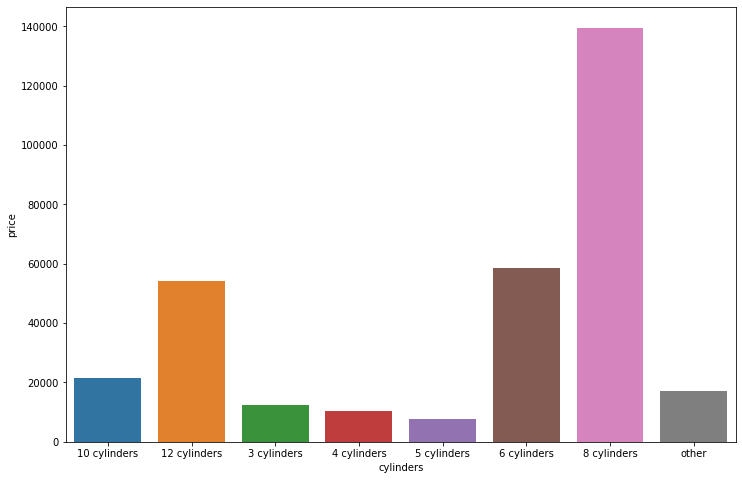

In [104]:
# The below chart shows which cylinder type drives the used car price most.
cylinders = dfa[['cylinders', 'price']].groupby( 'cylinders' ).mean().reset_index()
plt.figure(figsize=(12,8))
sns.barplot( x='cylinders', y='price', data=cylinders);


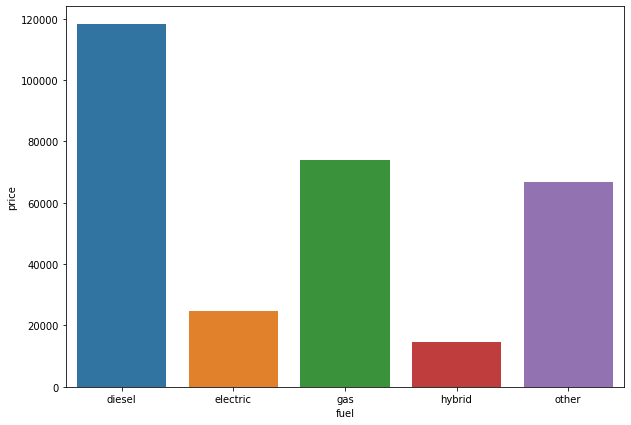

In [102]:
# The below chart shows which fuel type drives the used car price most.
fuel = dfa[['fuel', 'price']].groupby( 'fuel' ).mean().reset_index()
plt.figure(figsize=(10,7))
sns.barplot( x='fuel', y='price', data=fuel);


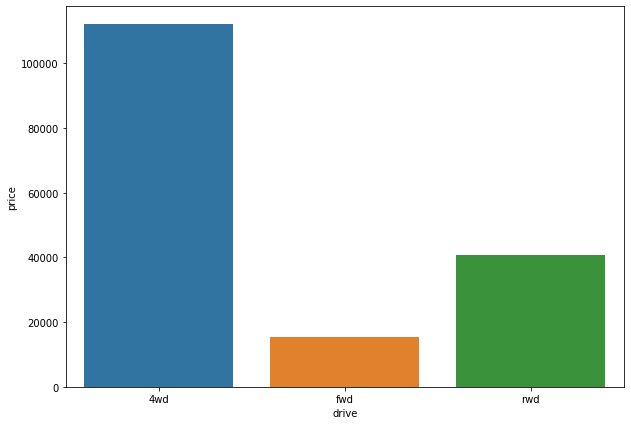

In [103]:
# The below chart shows which drive type drives the used car price most.
drive = dfa[['drive', 'price']].groupby( 'drive' ).mean().reset_index()
plt.figure(figsize=(10,7))
sns.barplot( x='drive', y='price', data=drive);

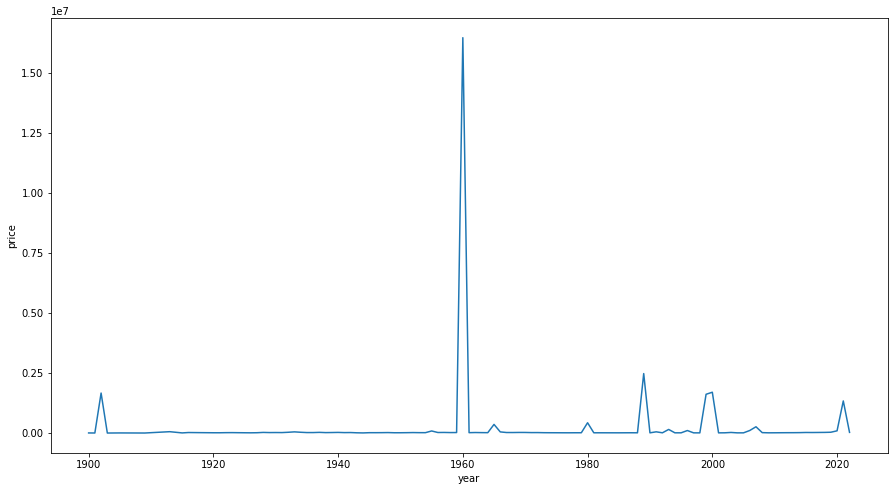

In [106]:
# The below chart shows which year  drives the used car price most.
year = dfa[['year', 'price']].groupby( 'year' ).mean().reset_index()
plt.figure(figsize=(15,8))
sns.lineplot( x='year', y='price', data=year);

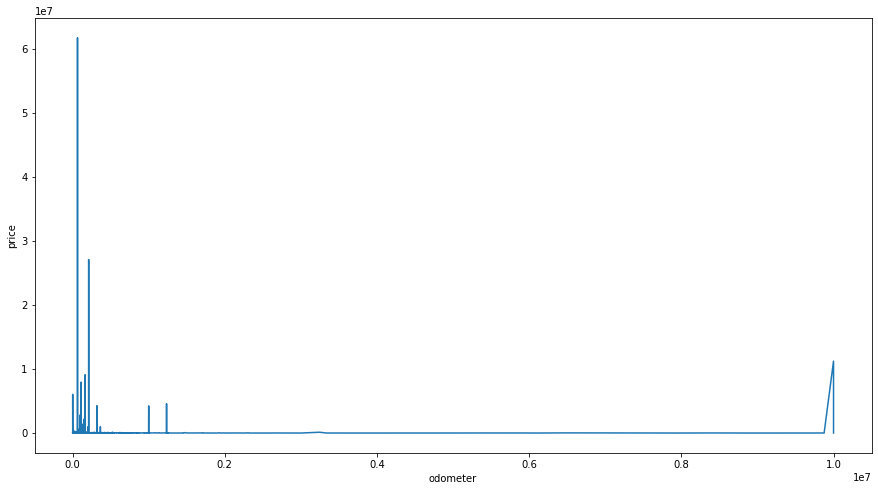

In [107]:
# The below chart shows how odometer values drives the used car price most.
odometer = dfa[['odometer', 'price']].groupby( 'odometer' ).mean().reset_index()
plt.figure(figsize=(15,8))
sns.lineplot( x='odometer', y='price', data=odometer);